In [ ]:
import torch
import torchvision
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchmetrics
from PIL import Image
from tqdm import tqdm
from data.guided_diffusion.unet import create_model
from src.utils import *
from src.h_fcn import *
from src.pigdm import PIGDM
from src.eval import *
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print("Device:", device)

Device: cuda:0


In [ ]:
# Load model
model_config = {'image_size': 256,
                'num_channels': 128,
                'num_res_blocks': 1,
                'channel_mult': '',
                'learn_sigma': True,
                'class_cond': False,
                'use_checkpoint': False,
                'attention_resolutions': 16,
                'num_heads': 4,
                'num_head_channels': 64,
                'num_heads_upsample': -1,
                'use_scale_shift_norm': True,
                'dropout': 0.0,
                'resblock_updown': True,
                'use_fp16': False,
                'use_new_attention_order': False,
                'model_path': '../data/ffhq_10m.pt'}
model = create_model(**model_config)
model = model.to(device)
# use in eval mode:
model.eval();


In [3]:
imgshape = (1, 3, 256, 256)
idx = 12 
img_pil = Image.open('../data/ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
x_true = pilimg_to_tensor(img_pil)

mask = torch.ones(imgshape, device=device)
h, w = 256, 256
hcrop, wcrop = h // 4, w // 4
corner_top, corner_left = int(h // 1.7) - hcrop // 1, w // 2 #- wcrop // 1
mask[:, :, corner_top:corner_top + hcrop, corner_left:corner_left + wcrop] = 0

H = Inpainting(mask)
y = H(x_true)

/home/onyxia/work/Generative_Modeling_Project/src/pigdm.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  alpha_s = torch.tensor(self.alphas_cp_torch[si].cpu() if si != -1 else 1.0, device=self.device, dtype=torch.float32).view(-1, 1, 1, 1)


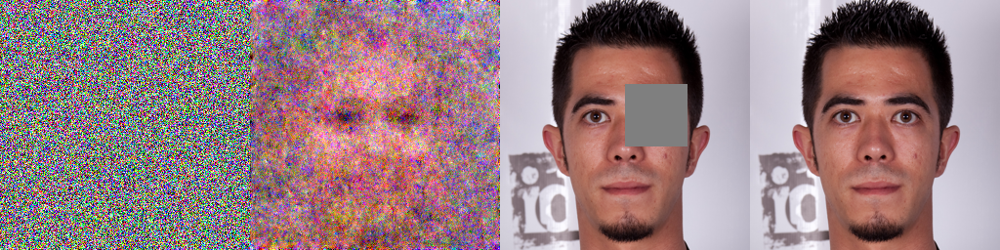

Sampling:  20%|██        | 200/1000 [00:47<03:07,  4.27it/s]

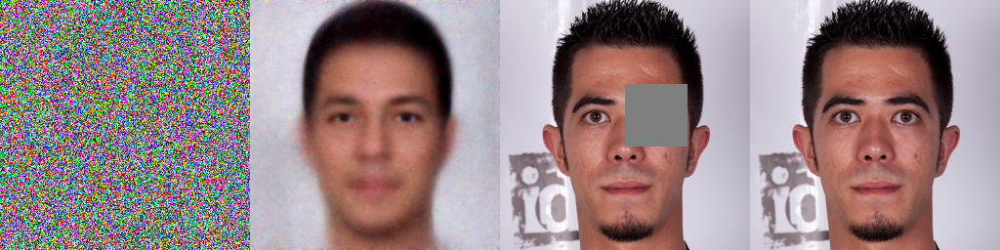

Sampling:  40%|████      | 400/1000 [01:34<02:20,  4.27it/s]

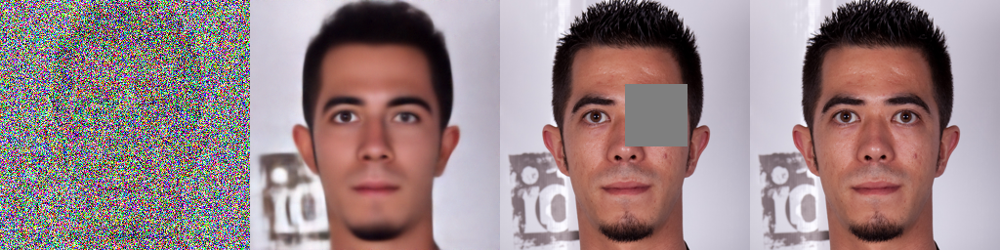

Sampling:  60%|██████    | 600/1000 [02:21<01:33,  4.28it/s]

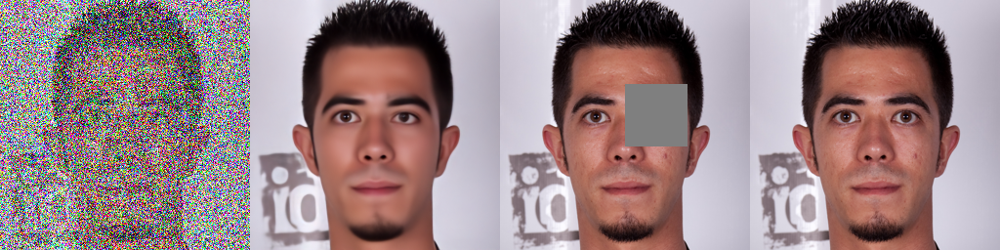

Sampling:  80%|████████  | 800/1000 [03:08<00:46,  4.28it/s]

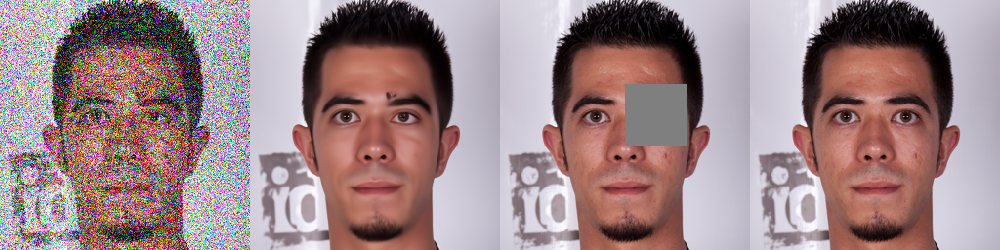

Sampling: 100%|██████████| 1000/1000 [03:54<00:00,  4.26it/s]


In [4]:
pgm = PIGDM(model, 256, H)

_ = pgm.posterior_sampling(y, x_true=x_true, show_steps=True)

High res

Sampling:   0%|          | 0/1000 [00:00<?, ?it/s]

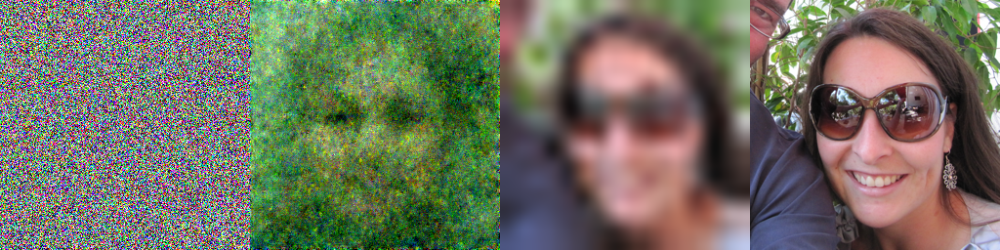

Sampling:  10%|█         | 100/1000 [00:23<03:30,  4.28it/s]

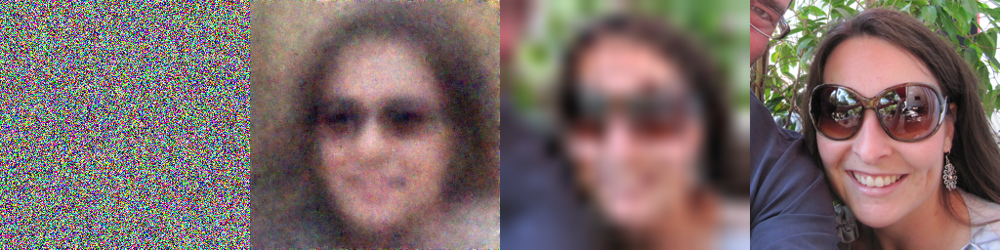

Sampling:  20%|██        | 200/1000 [00:46<03:08,  4.25it/s]

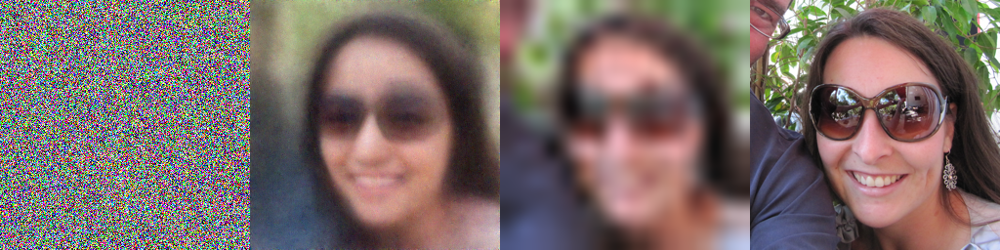

Sampling:  30%|███       | 300/1000 [01:10<02:44,  4.25it/s]

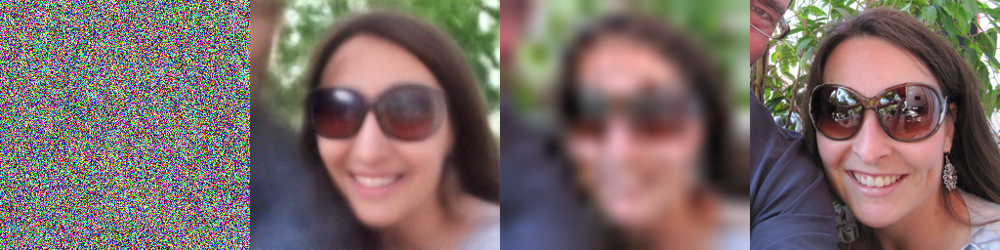

Sampling:  40%|████      | 400/1000 [01:34<02:21,  4.24it/s]

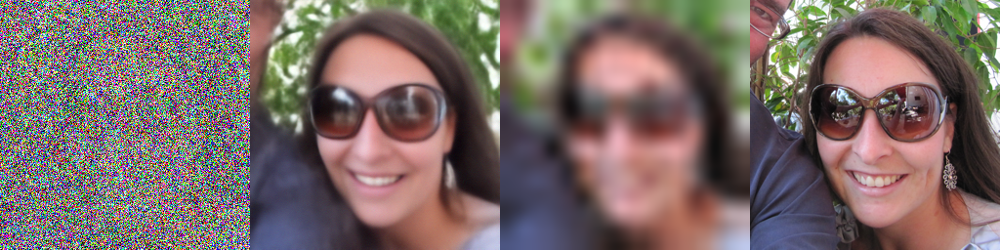

Sampling:  50%|█████     | 500/1000 [01:57<01:57,  4.24it/s]

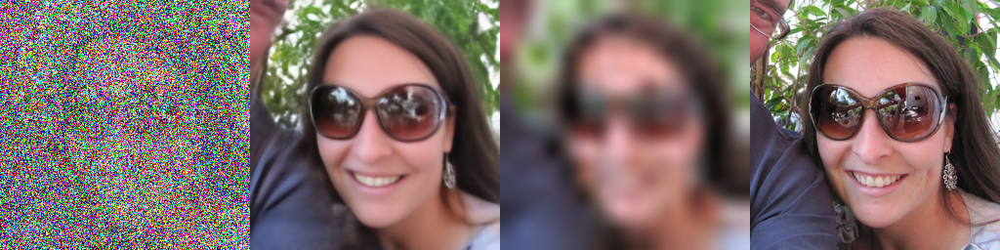

Sampling:  60%|██████    | 600/1000 [02:21<01:34,  4.25it/s]

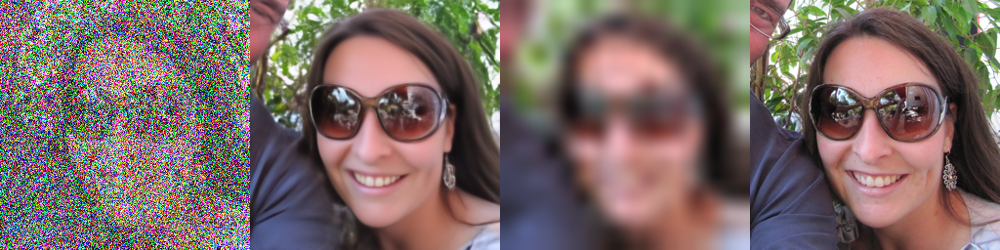

Sampling:  70%|███████   | 700/1000 [02:44<01:10,  4.26it/s]

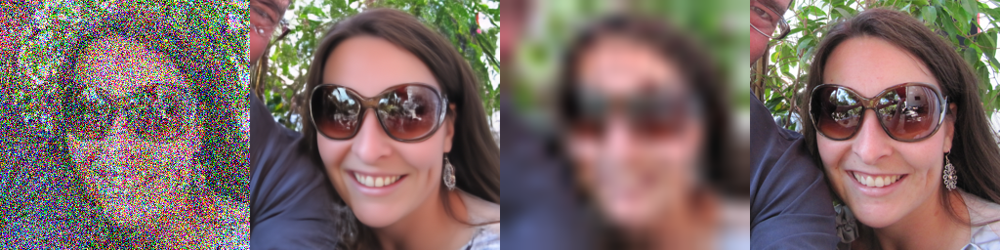

Sampling:  80%|████████  | 800/1000 [03:08<00:46,  4.27it/s]

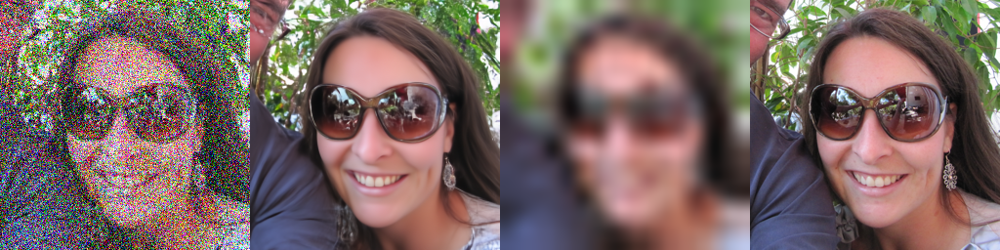

Sampling:  90%|█████████ | 900/1000 [03:31<00:23,  4.27it/s]

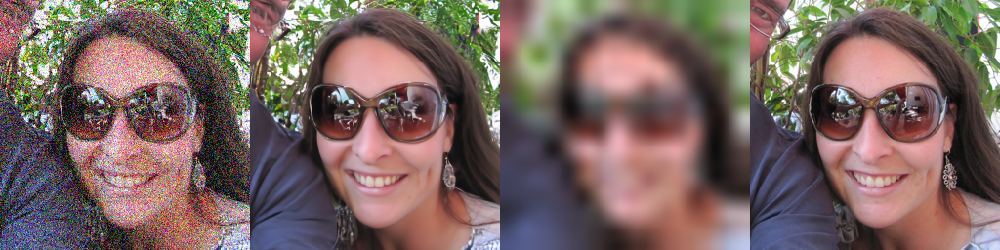

Sampling: 100%|██████████| 1000/1000 [03:55<00:00,  4.25it/s]


In [6]:

idx = 22
x_true_pil = Image.open('../data/ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
x_true = pilimg_to_tensor(x_true_pil)

scale = 4
H = Superres(scale)
y = H(x_true)

pgm = PIGDM(model, 256, H)

_ = pgm.posterior_sampling(y, x_true=x_true, show_steps=True, steps_viz=100)

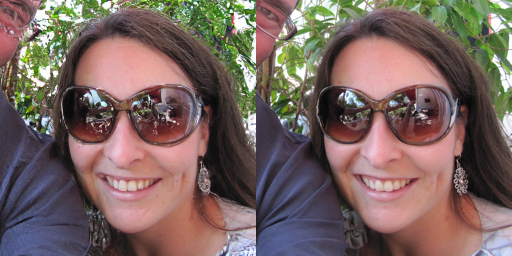

In [7]:
_ = display_as_pilimg(torch.cat((_[0][0], x_true.cpu()), dim=3))

# Evaluation

In [7]:
dataset_path = '../data/ffhq256-1k-validation/'
num_images = 10  # Number of images for evaluation
num_samples = 1    # Number of samples per image
ts = np.linspace(0, 999, 100, dtype=int)

In [8]:
print("Evaluating Inpainting...")
mask = torch.ones(imgshape, device=device)
h, w = 256, 256
hcrop, wcrop = h // 4, w // 4
corner_top, corner_left = int(h // 1.7) - hcrop // 1, w // 2 - wcrop // 2
mask[:, :, corner_top:corner_top + hcrop, corner_left:corner_left + wcrop] = 0
inpainting_results = evaluate_model(model, Inpainting, dataset_path, num_images=num_images, num_samples=num_samples, eta=1.0, awd=True, mask=mask, show_steps=False)
print("Inpainting Results:", inpainting_results)

Evaluating Inpainting...


/opt/conda/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `PeakSignalNoiseRatio` from `torchmetrics` was deprecated and will be removed in 2.0. Import `PeakSignalNoiseRatio` from `torchmetrics.image` instead.
  _future_warning(
/opt/conda/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(
Evaluating Images: 100%|██████████| 1/1 [03:52<00:00, 232.86s/it]

Inpainting Results: {'PSNR': np.float64(38.661888122558594), 'SSIM': np.float64(0.9874722361564636), 'LPIPS': np.float64(0.004906658548861742)}


In [11]:
print("\nEvaluating Super-Resolution...")
superres_results = evaluate_model(model, Superres, dataset_path, num_images=num_images, num_samples=num_samples, eta=1.0, awd=False, scale_factor=4, show_steps=False)
print("Super-Resolution Results:", superres_results)


Evaluating Super-Resolution...


Evaluating Images: 100%|██████████| 1/1 [03:52<00:00, 232.37s/it]

Super-Resolution Results: {'PSNR': np.float64(10.553455352783203), 'SSIM': np.float64(0.15471386909484863), 'LPIPS': np.float64(0.6922999620437622)}
